# Exploring clusters in the self-supervised CNN model on Shorelines data

This notebook analyzes the geometric structure learned by the self-supervised
CNN trained on shoreline images. We extract embeddings from the model and apply
unsupervised clustering methods to understand how fractal shapes organize
themselves in the learned feature space. The workflow includes:

- computing embeddings for all shoreline samples
- exploring cluster structure with K-means and the elbow method
- projecting the embedding space with UMAP for visualization
- identifying natural density-based clusters using HDBSCAN
- comparing how different parameter choices affect the number and stability of clusters

The goal is to reveal meaningful geometric families—such as spirals, bulbs,
filaments, and valleys—and evaluate how well the model separates them in its
latent space.


## import libraries and packages for loading data and model

In [1]:
# Python
import os
from pathlib import Path

# datascience and ML
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import umap
import hdbscan

# torch
import torch
from torch.utils.data import DataLoader
import torchvision.transforms as T

# env
from dotenv import load_dotenv
load_dotenv()

# local
from ai_fractals.models.self_supervised_cnn import SelfSupervisedCNN
from ai_fractals.data import ShorelineDataset

/home/dyretna/.pyenv/versions/fractal_ai/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Paths
PROJECT_ROOT = Path(os.getenv("PROJECT_ROOT"))
DATASET = PROJECT_ROOT / "dataset" / "shoreline" / "evaluated"
MODELS_DIR = PROJECT_ROOT / "models"
MODEL_PATH = MODELS_DIR / "self_supervised_cnn.pth"

# Transform (no augmentation!)
transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

dataset = ShorelineDataset(DATASET, transform=transform)
loader = DataLoader(dataset, batch_size=32, shuffle=False)

# Load model
device = "cuda" if torch.cuda.is_available() else "cpu"
model = SelfSupervisedCNN(embedding_dim=256).to(device)
state = torch.load(MODEL_PATH, map_location=device, weights_only=True)
model.load_state_dict(state)
model.eval()

print("Dataset size:", len(dataset))

Dataset size: 10289


In [ ]:
embeddings = []

with torch.no_grad():
    for batch in loader:
        batch = batch.to(device)
        z = model(batch)
        embeddings.append(z.cpu())

# 1. PyTorch-format for GAN
embeddings_torch = torch.cat(embeddings, dim=0)
# torch.save(embeddings_torch, MODELS_DIR / "cnn_embeddings.pt")

# 2. NumPy-format for UMAP/HDBSCAN/kmeans
embeddings_numpy = embeddings_torch.numpy()

print("Torch:", embeddings_torch.shape, embeddings_torch.dtype)
print("NumPy:", embeddings_numpy.shape, embeddings_numpy.dtype)

Torch: torch.Size([10289, 256]) torch.float32
NumPy: (10289, 256) float32


# Exploring clusters with K-means
In this section we explore how well the self-supervised CNN (trained in a  
SimCLR-style contrastive setup) organizes fractal shoreline geometry in  
its embedding space. We apply K-means clustering to the embeddings and  
use the elbow method to estimate a reasonable number of clusters.  

K-means assumes that clusters are roughly spherical and well-separated.  
If the embedding space contains clear geometric families, the inertia  
curve will show a noticeable “elbow” where adding more clusters yields  
diminishing returns. However, if the curve is almost perfectly smooth,  
this indicates that the manifold is continuous and does not contain  
strongly separated groups.

Even in that case, K-means is still useful for creating a practical  
partition of the embedding space (e.g., for GAN conditioning), but the  
choice of k becomes more about utility than about discovering “true”  
clusters. For a more natural, density-based view of the geometry, we  
later compare these results with a UMAP + HDBSCAN pipeline, which can  
identify organic cluster structure without requiring a predefined k.  



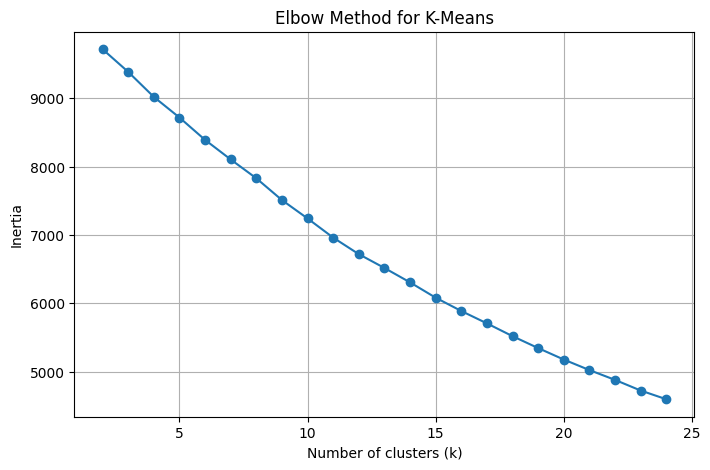

In [ ]:
inertias = []
K = range(2, 25)

for k in K:
    km = KMeans(n_clusters=k, n_init=20)
    km.fit(embeddings)
    inertias.append(km.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K, inertias, marker="o")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for K-Means")
plt.grid(True)
plt.show()


In [ ]:
n_clusters = 12
kmeans = KMeans(n_clusters=n_clusters, n_init=20)
labels = kmeans.fit_predict(embeddings)

labels[:20]


array([ 1,  1,  1,  1,  1,  7,  2, 11,  1,  1,  6,  1,  6,  6,  8, 11,  5,
       11,  1,  6], dtype=int32)

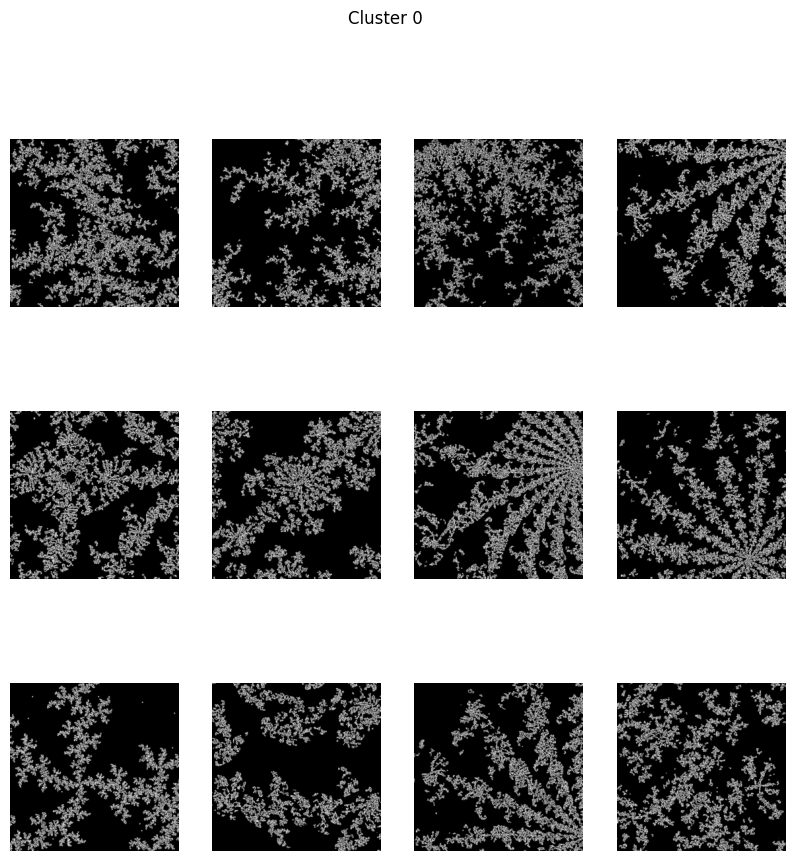

In [ ]:
def show_cluster(cluster_id, n=12):
    idx = np.where(labels == cluster_id)[0][:n]
    imgs = [dataset[i][0] for i in idx]

    plt.figure(figsize=(10, 10))
    for i, img in enumerate(imgs):
        plt.subplot(3, 4, i+1)
        plt.imshow(img.squeeze(), cmap="gray")
        plt.axis("off")
    plt.suptitle(f"Cluster {cluster_id}")
    plt.show()

show_cluster(0)


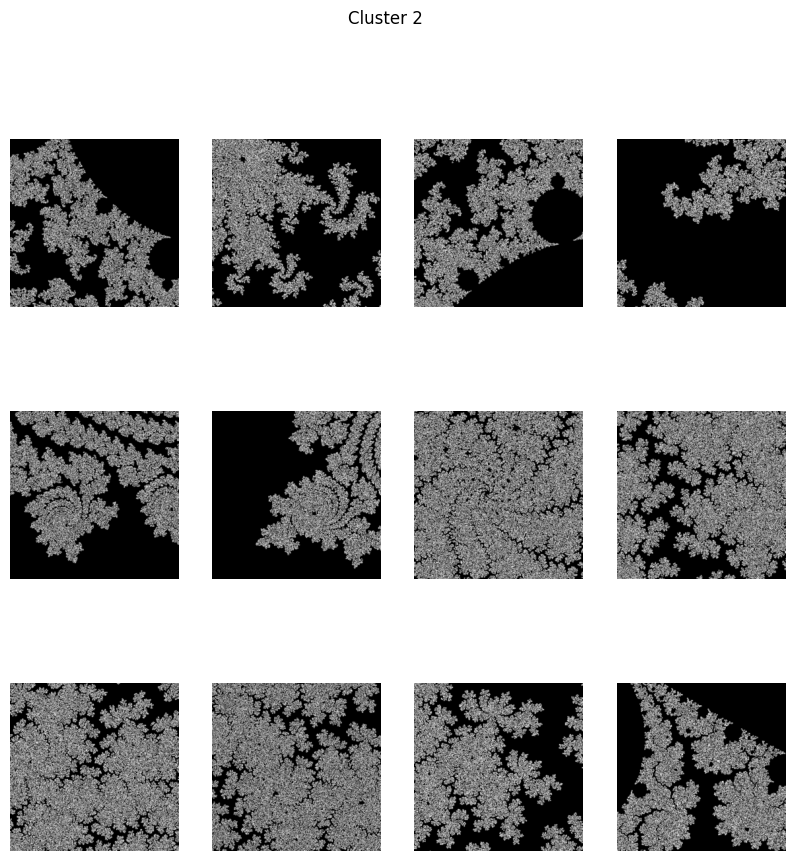

In [ ]:
show_cluster(2)

# Exploring clusters with UMAP and HDBSCAN 

In this section we explore the structure of the embedding space using a  
UMAP + HDBSCAN pipeline. Unlike K-means, which requires a predefined  
number of clusters, HDBSCAN identifies clusters based on density and can  
separate regions of the manifold that differ in local structure. UMAP is  
used to project the high-dimensional embeddings into a 2D space while  
preserving local geometry, making it easier to visualize how the model  
organizes shoreline shapes.  

By adjusting UMAP’s neighborhood parameters and HDBSCAN’s density  
thresholds, we can reveal both coarse and fine-grained geometric  
families—splitting large regions into meaningful subclusters while  
avoiding over-segmentation. This allows us to inspect how the  
self-supervised CNN groups similar shoreline patterns and to understand  
the underlying manifold learned by the model.  

Finding the right UMAP and HDBSCAN parameters requires some experimentation, as
different settings reveal different levels of structure in the embedding space.

In [ ]:
umap_model = umap.UMAP(
    n_neighbors=5,
    min_dist=0.01,
    n_components=2,
    metric="cosine",
    random_state=42
)

emb2d = umap_model.fit_transform(embeddings)
emb2d.shape

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=100,
    min_samples=20,
    cluster_selection_epsilon=0.0
)

labels_hdb = clusterer.fit_predict(emb2d)
np.unique(labels_hdb)


/home/dyretna/.pyenv/versions/fractal_ai/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21])

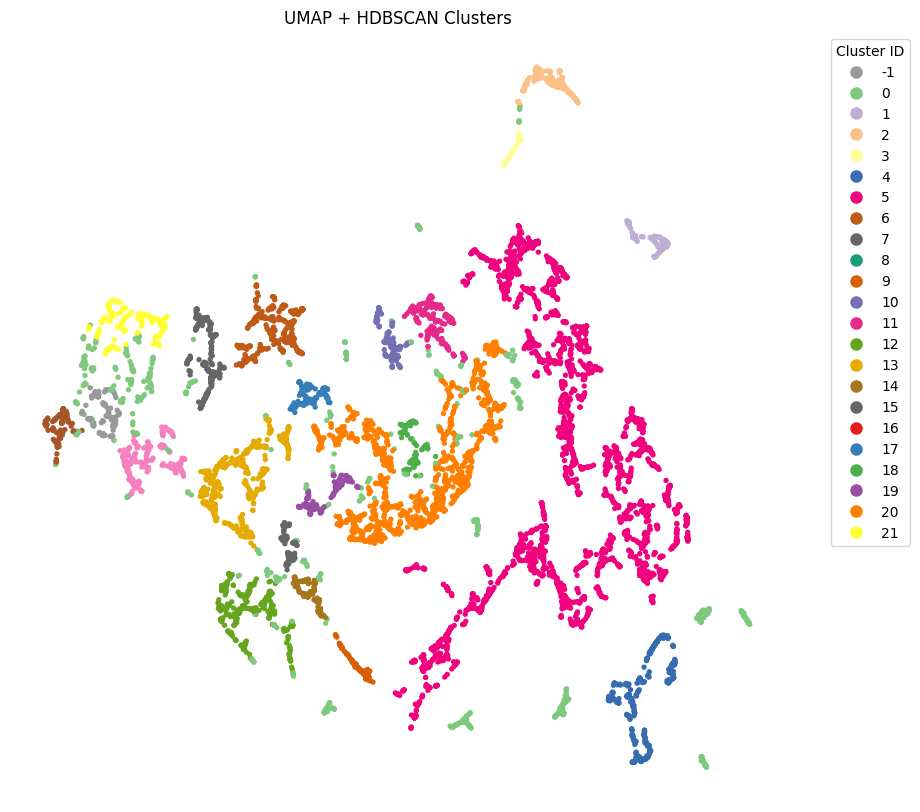

In [ ]:
from matplotlib.colors import ListedColormap

# Build combined colormap
set1 = plt.get_cmap("Accent").colors
set2 = plt.get_cmap("Dark2").colors
set3 = plt.get_cmap("Set1").colors
combined_colors = list(set1) + list(set2) + list(set3)
combined_cmap = ListedColormap(combined_colors)

unique_labels = np.unique(labels_hdb)

plt.figure(figsize=(10, 10))
scatter = plt.scatter(
    emb2d[:, 0],
    emb2d[:, 1],
    c=labels_hdb,
    cmap=combined_cmap,
    s=8
)
plt.title("UMAP + HDBSCAN Clusters")
plt.axis("off")

# Manually build legend with correct colors
handles = []
for lab in unique_labels:
    handles.append(
        plt.Line2D(
            [], [],
            marker="o",
            linestyle="",
            markersize=8,
            color=combined_cmap(lab % len(combined_colors)),
            label=str(lab)
        )
    )

plt.legend(
    handles=handles,
    title="Cluster ID",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.show()


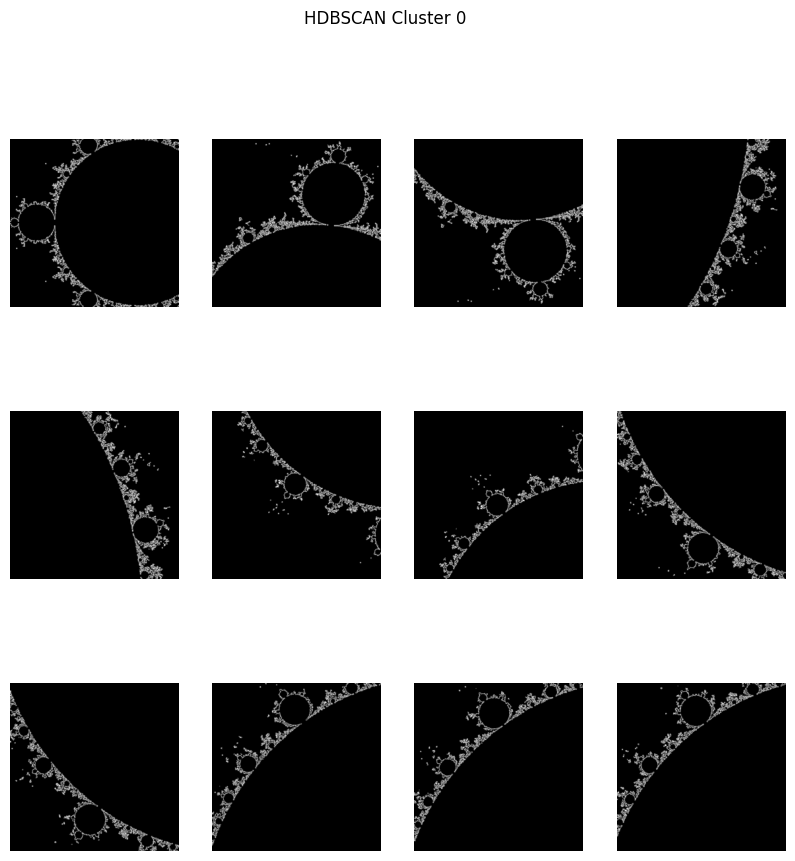

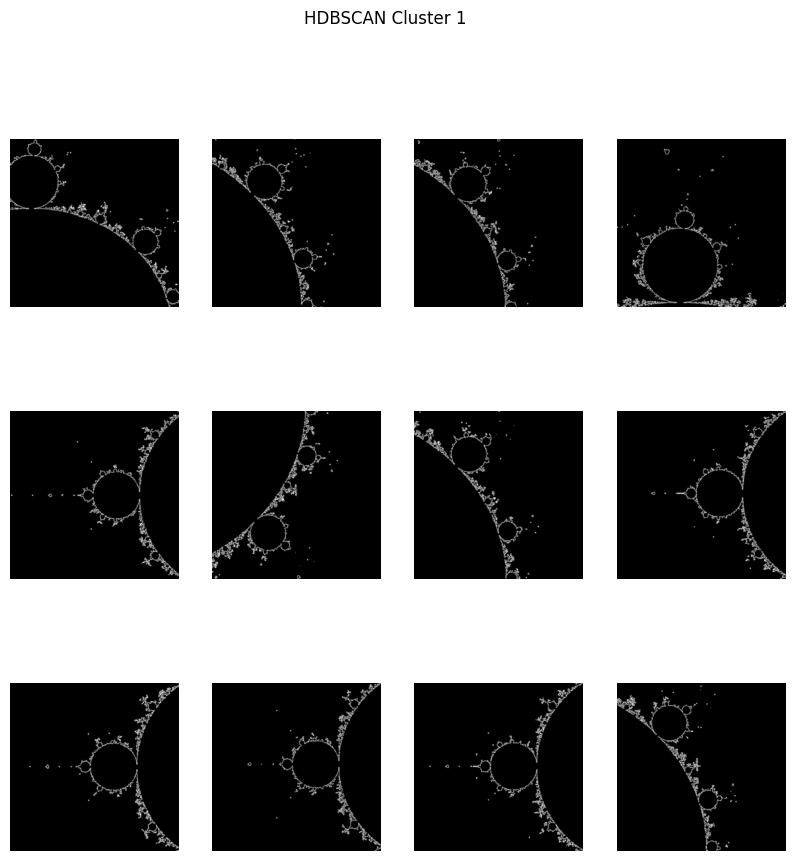

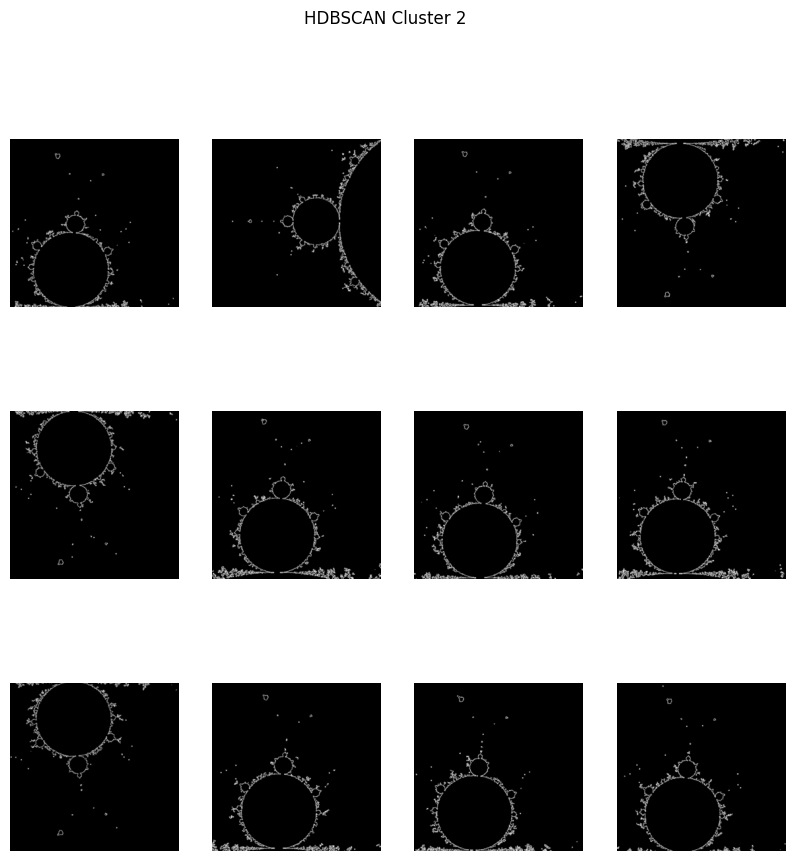

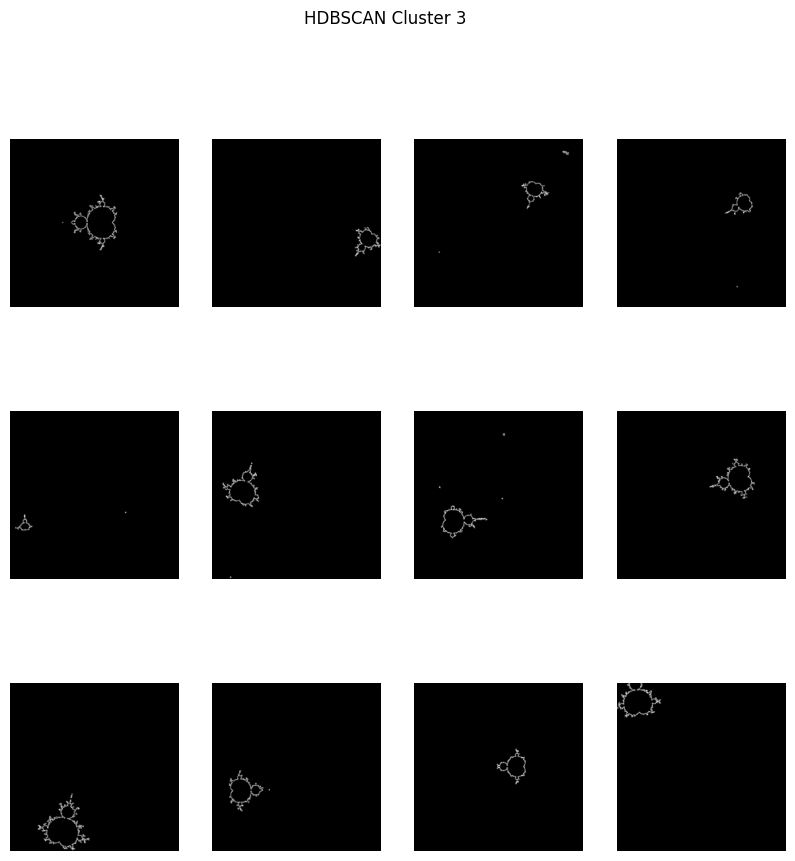

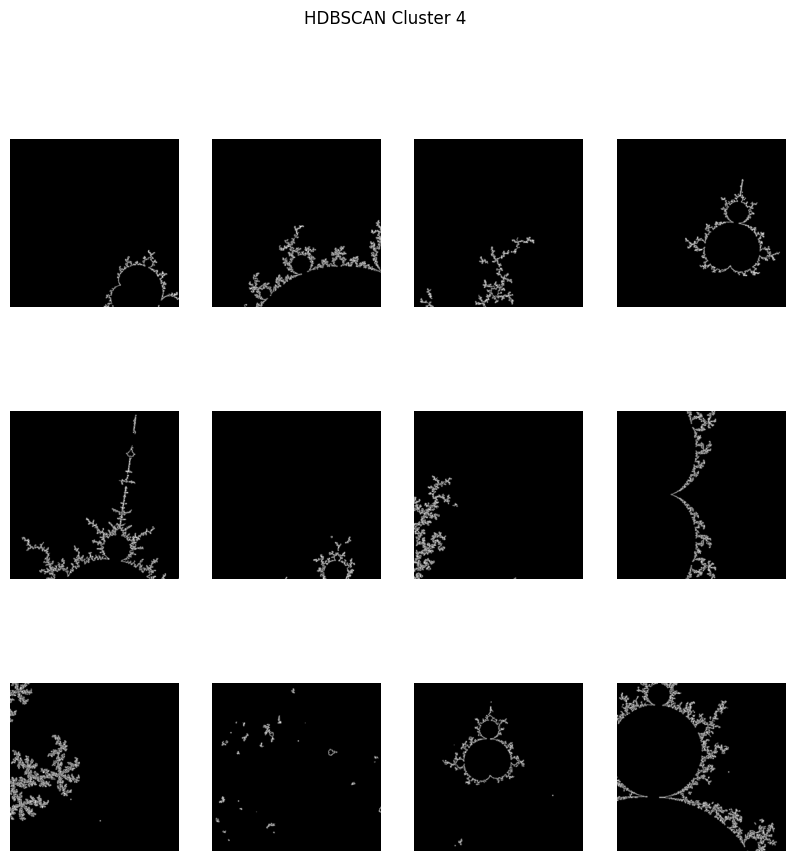

...

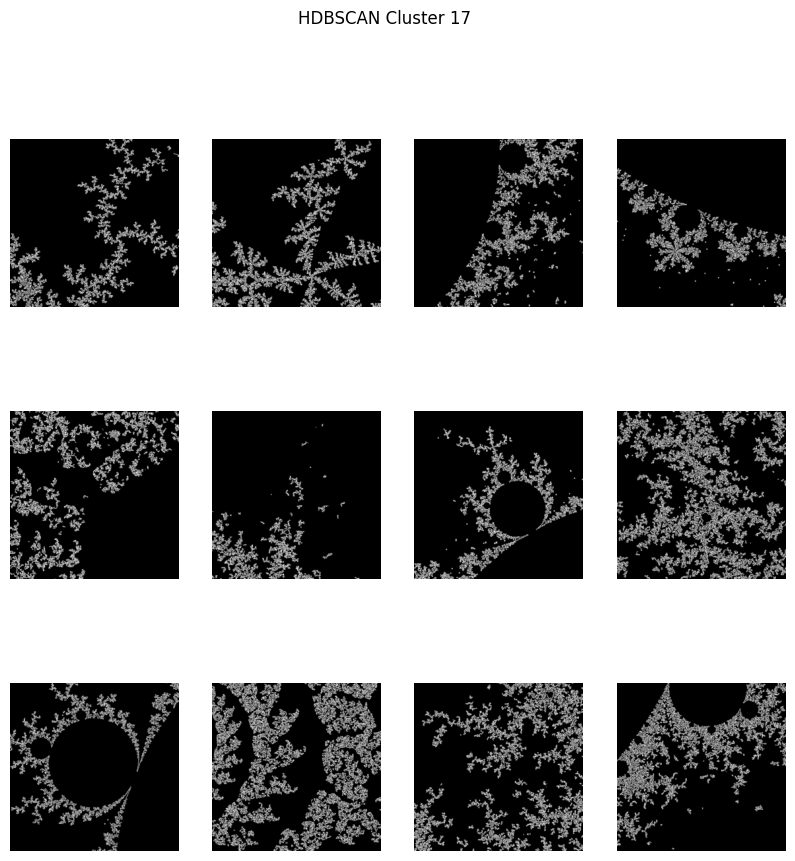

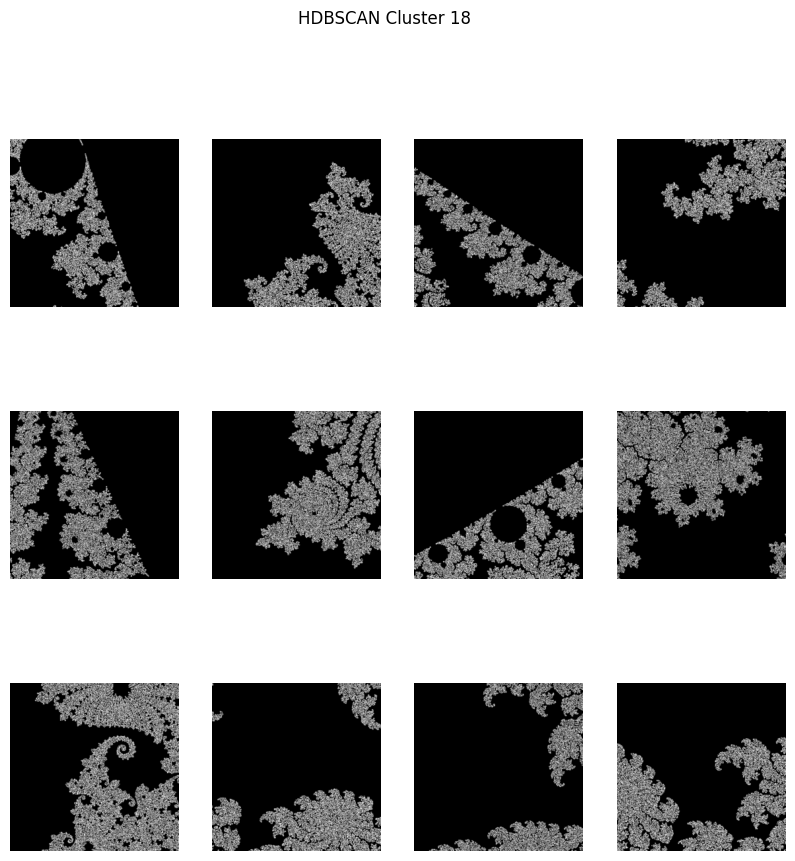

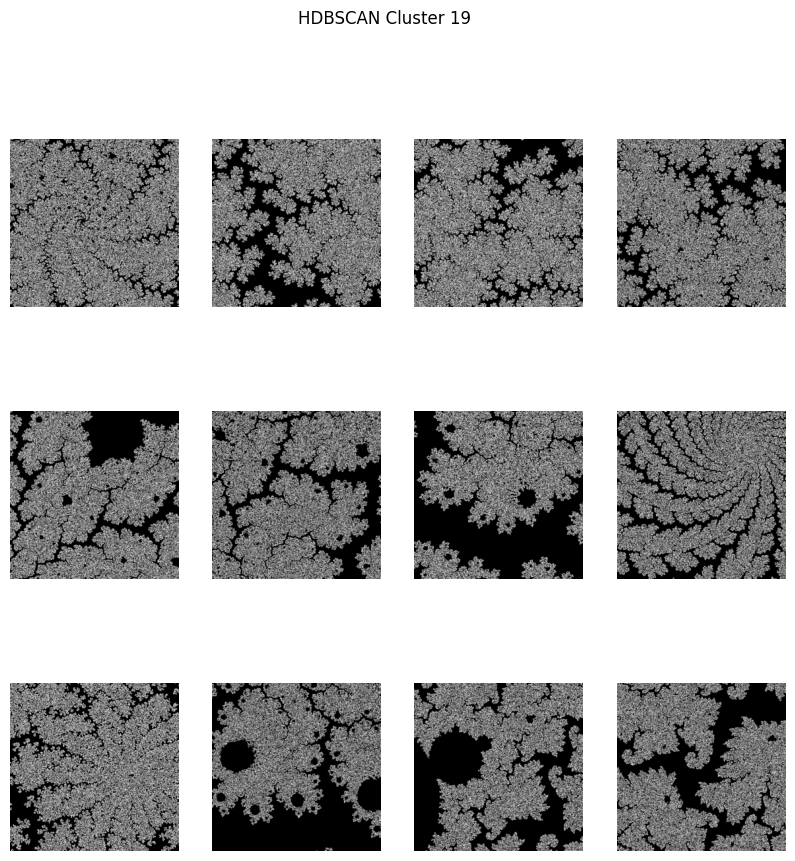

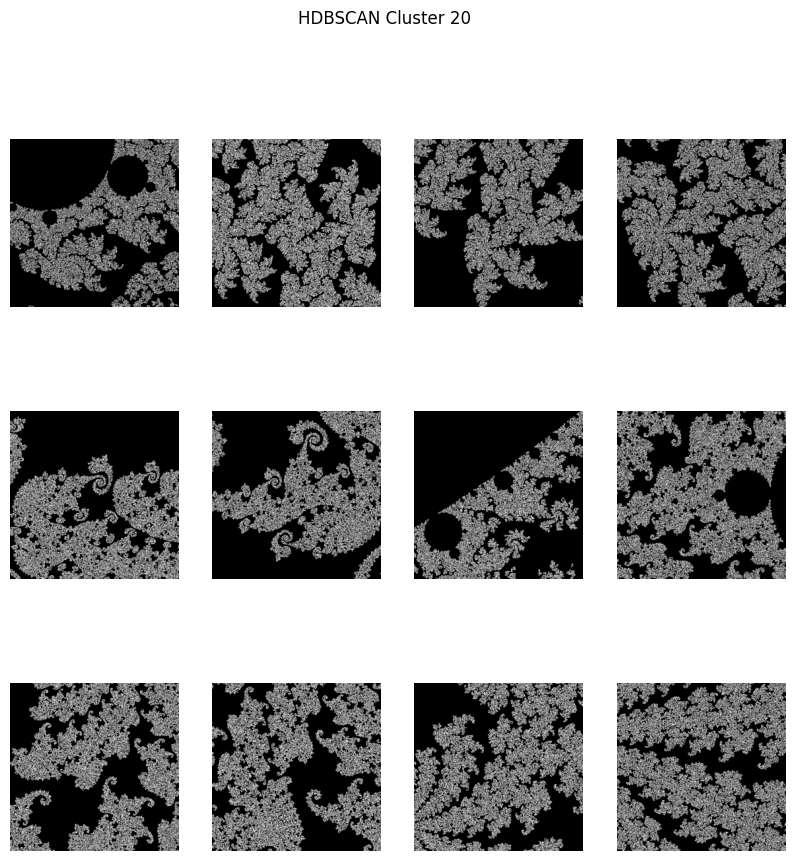

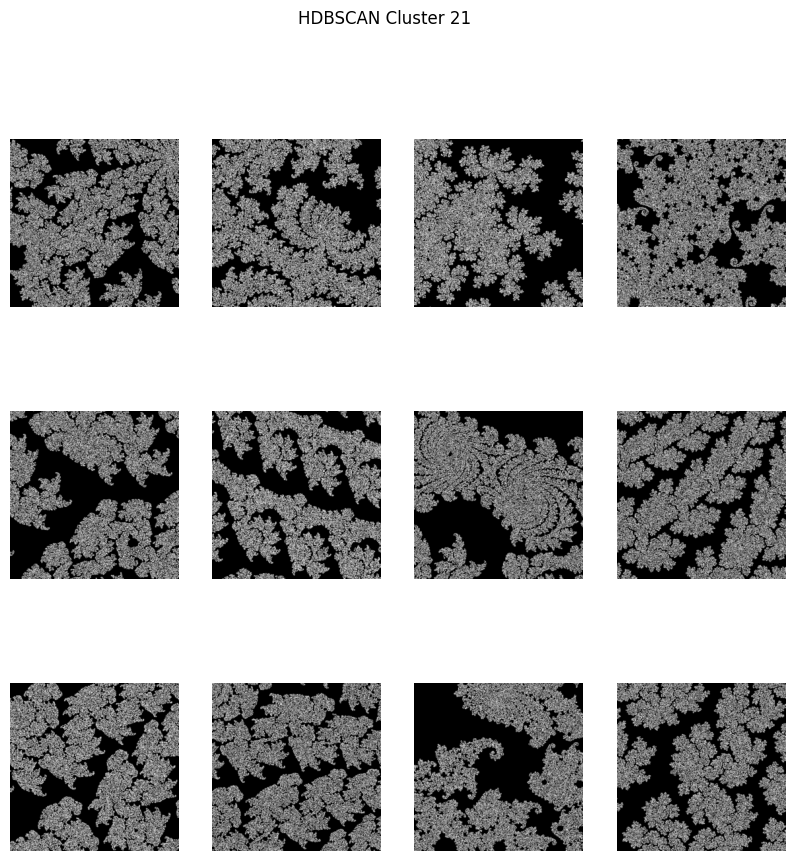

In [ ]:
def show_hdbscan_cluster(cluster_id, n=12):
    idx = np.where(labels_hdb == cluster_id)[0][:n]
    imgs = [dataset[i][0] for i in idx]

    plt.figure(figsize=(10, 10))
    for i, img in enumerate(imgs):
        plt.subplot(3, 4, i+1)
        plt.imshow(img.squeeze(), cmap="gray")
        plt.axis("off")
    plt.suptitle(f"HDBSCAN Cluster {cluster_id}")
    plt.show()

# Show all clusters
for cid in np.unique(labels_hdb):
    if cid == -1:
        continue
    show_hdbscan_cluster(cid)
